In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!rm -rf /content/Data_200

!unzip -q /content/drive/MyDrive/AppML/jpegs_all_over_6755.zip -d /content/Data_200
!unzip -q /content/drive/MyDrive/AppML/jpegs_all_under_equal_6755.zip -d /content/Data_200
print('Done unzipping')

Done unzipping


In [3]:
import os
import subprocess
import random
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.models import efficientnet_b3, EfficientNet_B3_Weights
from PIL import Image

from sklearn.preprocessing import normalize
from sklearn.decomposition import PCA
import umap
import hdbscan

print(f"PyTorch {torch.__version__}")

if torch.cuda.is_available():
    device = torch.device("cuda")
elif hasattr(torch.backends, "mps") and torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")

print(f"Using device: {device}")
assert device.type in ("cuda", "mps"), "GPU not available — check Runtime > Change runtime type"

PyTorch 2.11.0+cu128
Using device: cuda


In [42]:
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
#  CONFIGURE THESE
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
DATA_DIR        = '/content/Data_200'
IMG_SIZE        = 200
BATCH_SIZE      = 64    # extraction only — no backprop, so large batches are fine
NUM_SAMPLES     = -1    # -1 = use all images

# PCA / UMAP
PCA_DIMS        = 128   # PCA reduction before UMAP
UMAP_DIMS       = 20    # lower = coarser structure = fewer clusters
UMAP_NEIGHBORS  = 50    # higher = more global view of the dataset
UMAP_MIN_DIST   = 0.1   # used only for 2D visualisation

# HDBSCAN  (density-based, no fixed K, labels outliers as -1)
HDBSCAN_MIN_CLUSTER_SIZE = 500   # ~0.5% of 90k — raise to get fewer clusters
HDBSCAN_MIN_SAMPLES      = 50    # raise to mark more edge points as noise

# K-Means  (fixed K, every image assigned to a cluster)
KMEANS_K        = 5

OUTPUT_DIR      = "output"
SEED            = 42
# ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

os.makedirs(OUTPUT_DIR, exist_ok=True)
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)


In [5]:
def kill_stale_gpu_processes():
    """Kill any process holding GPU memory that isn't this kernel."""
    result = subprocess.run(['fuser', '/dev/nvidia0'], capture_output=True, text=True)
    pids   = result.stdout.strip().split()
    my_pid = str(os.getpid())
    killed = []
    for pid in pids:
        if pid != my_pid:
            subprocess.run(['kill', '-9', pid])
            killed.append(pid)
    if killed:
        print(f"Killed stale GPU processes: {killed}")
    torch.cuda.empty_cache()
    if torch.cuda.is_available():
        free, total = torch.cuda.mem_get_info()
        print(f"GPU free: {free/1024**3:.2f} GiB / {total/1024**3:.2f} GiB")

kill_stale_gpu_processes()

GPU free: 14.46 GiB / 14.56 GiB


In [6]:
class ImageFolderFlat(Dataset):
    """Loads all images from a flat directory. No labels required."""

    VALID_EXT = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff", ".webp"}

    def __init__(self, root_dir: str, transform=None, max_samples: int = -1):
        self.transform = transform
        paths = sorted(
            p for p in Path(root_dir).iterdir()
            if p.suffix.lower() in self.VALID_EXT
        )
        if max_samples > 0:
            paths = paths[:max_samples]
        if not paths:
            raise FileNotFoundError(f"No valid images found in {root_dir}")
        self.paths = paths
        print(f"✓ Found {len(self.paths)} images")

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("L")
        if self.transform:
            img = self.transform(img)
        return img, str(self.paths[idx])   # return path so we can map clusters back


transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.Grayscale(num_output_channels=3),  # PIL L -> PIL RGB (3 identical channels)
    transforms.ToTensor(),                         # then to tensor — now shape [3, H, W]
    transforms.Normalize(mean=[0.4590, 0.4590, 0.4590],
                         std=[0.1505, 0.1505, 0.1505]),
])

dataset = ImageFolderFlat(DATA_DIR, transform=transform, max_samples=NUM_SAMPLES)
loader  = DataLoader(
    dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,          # keep order so indices map back to paths
    num_workers=2,
    pin_memory=True,
    persistent_workers=True,
)

✓ Found 88869 images


In [7]:
kill_stale_gpu_processes()

# EfficientNet-B3 — fully frozen, used as a fixed feature extractor.
# At 200x200 the deepest feature map is 7x7x1536; AdaptiveAvgPool collapses to 1536-d.
backbone   = efficientnet_b3(weights=EfficientNet_B3_Weights.IMAGENET1K_V1)
extractor  = nn.Sequential(backbone.features, backbone.avgpool, nn.Flatten())
extractor  = extractor.to(device).eval()

for param in extractor.parameters():
    param.requires_grad = False

total_params = sum(p.numel() for p in extractor.parameters())
print(f"Extractor parameters: {total_params:,}  (all frozen)")

GPU free: 14.46 GiB / 14.56 GiB
Extractor parameters: 10,696,232  (all frozen)


In [8]:
all_embeddings = []
all_paths      = []

with torch.no_grad():
    for imgs, paths in loader:
        imgs = imgs.to(device)
        with torch.amp.autocast("cuda", enabled=(device.type == "cuda")):
            feats = extractor(imgs)          # (B, 1536)
        all_embeddings.append(feats.cpu().numpy())
        all_paths.extend(paths)

embeddings = np.vstack(all_embeddings)       # (N, 1536)
print(f"Embeddings shape: {embeddings.shape}")

# L2-normalise so cosine distance ≈ Euclidean distance in the unit hypersphere
embeddings = normalize(embeddings, norm='l2')
print("L2 normalisation done")

Embeddings shape: (88869, 1536)
L2 normalisation done


In [9]:
# ── PCA: randomized solver is much faster at 90k scale ────────────────────
print(f"PCA: 1536 → {PCA_DIMS} dims...")
pca           = PCA(n_components=PCA_DIMS, random_state=SEED, svd_solver='randomized')
emb_pca       = pca.fit_transform(embeddings)
var_explained = pca.explained_variance_ratio_.sum()
print(f"  Variance explained: {var_explained:.1%}")

# ── UMAP (high-dim): used for HDBSCAN and K-Means clustering ──────────────
print(f"UMAP: {PCA_DIMS} → {UMAP_DIMS} dims  (clustering)...")
reducer_hd  = umap.UMAP(
    n_components = UMAP_DIMS,
    n_neighbors  = UMAP_NEIGHBORS,
    min_dist     = 0.05,   # small but non-zero — avoids collapsing all points into one blob
    metric       = 'cosine',
    random_state = SEED,
    low_memory   = True,   # essential at 90k scale
    n_epochs     = 200,    # default 500 is overkill at this scale
    verbose      = True,
)
emb_umap_hd = reducer_hd.fit_transform(emb_pca)

# ── UMAP (2D): visualisation only ─────────────────────────────────────────
print(f"UMAP: {PCA_DIMS} → 2 dims  (visualisation)...")
reducer_2d  = umap.UMAP(
    n_components = 2,
    n_neighbors  = UMAP_NEIGHBORS,
    min_dist     = UMAP_MIN_DIST,
    metric       = 'cosine',
    random_state = SEED,
    low_memory   = True,
    n_epochs     = 200,
    verbose      = True,
)
emb_umap_2d = reducer_2d.fit_transform(emb_pca)
print("UMAP done")


PCA: 1536 → 128 dims...
  Variance explained: 69.8%
UMAP: 128 → 20 dims  (clustering)...
UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.05, n_components=20, n_epochs=200, n_jobs=1, n_neighbors=50, random_state=42, verbose=True)
Wed Jun  3 11:51:22 2026 Construct fuzzy simplicial set
Wed Jun  3 11:51:22 2026 Finding Nearest Neighbors
Wed Jun  3 11:51:22 2026 Building RP forest with 20 trees


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Wed Jun  3 11:51:26 2026 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	Stopping threshold met -- exiting after 3 iterations
Wed Jun  3 11:52:23 2026 Finished Nearest Neighbor Search
Wed Jun  3 11:52:29 2026 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Wed Jun  3 11:56:29 2026 Finished embedding
UMAP: 128 → 2 dims  (visualisation)...
UMAP(angular_rp_forest=True, metric='cosine', n_epochs=200, n_jobs=1, n_neighbors=50, random_state=42, verbose=True)
Wed Jun  3 11:56:29 2026 Construct fuzzy simplicial set
Wed Jun  3 11:56:29 2026 Finding Nearest Neighbors
Wed Jun  3 11:56:29 2026 Building RP forest with 20 trees


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Wed Jun  3 11:56:30 2026 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	Stopping threshold met -- exiting after 3 iterations
Wed Jun  3 11:57:12 2026 Finished Nearest Neighbor Search
Wed Jun  3 11:57:14 2026 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Wed Jun  3 11:59:33 2026 Finished embedding
UMAP done


In [10]:
print("HDBSCAN clustering...")
clusterer = hdbscan.HDBSCAN(
    min_cluster_size = HDBSCAN_MIN_CLUSTER_SIZE,
    min_samples      = HDBSCAN_MIN_SAMPLES,
    metric           = 'euclidean',    # on UMAP-reduced space
    cluster_selection_method = 'eom', # excess of mass — finds clusters of varying density
)
labels = clusterer.fit_predict(emb_umap_hd)   # -1 = noise/outlier

n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise    = (labels == -1).sum()
print(f"Clusters found:  {n_clusters}")
print(f"Noise points:    {n_noise}  ({100*n_noise/len(labels):.1f}%)")
print(f"Cluster sizes:")
for cid in sorted(set(labels)):
    name = f"  Cluster {cid:3d}" if cid >= 0 else "  Noise      "
    print(f"{name}: {(labels == cid).sum():5d} images")

HDBSCAN clustering...
Clusters found:  2
Noise points:    0  (0.0%)
Cluster sizes:
  Cluster   0:   984 images
  Cluster   1: 87885 images


In [43]:
from sklearn.cluster import MiniBatchKMeans

# MiniBatchKMeans rather than standard KMeans — handles 90k samples without
# running out of memory, converges in minutes instead of hours.
print(f"K-Means clustering  (K={KMEANS_K})...")
kmeans = MiniBatchKMeans(
    n_clusters        = KMEANS_K,
    random_state      = SEED,
    batch_size        = 4096,   # large batch = more stable updates
    n_init            = 10,      # run 10 initialisations, keep best inertia
    max_iter          = 300,
    verbose           = 1,
)
kmeans_labels = kmeans.fit_predict(emb_umap_hd)

print(f"\nK-Means cluster sizes:")
for cid in sorted(set(kmeans_labels)):
    print(f"  Cluster {cid:3d}: {(kmeans_labels == cid).sum():6d} images")

K-Means clustering  (K=5)...
Init 1/10 with method k-means++
Inertia for init 1/10: 34726.1796875
Init 2/10 with method k-means++
Inertia for init 2/10: 33695.02734375
Init 3/10 with method k-means++
Inertia for init 3/10: 32656.2890625
Init 4/10 with method k-means++
Inertia for init 4/10: 33108.35546875
Init 5/10 with method k-means++
Inertia for init 5/10: 35283.25
Init 6/10 with method k-means++
Inertia for init 6/10: 38720.43359375
Init 7/10 with method k-means++
Inertia for init 7/10: 32619.208984375
Init 8/10 with method k-means++
Inertia for init 8/10: 34919.07421875
Init 9/10 with method k-means++
Inertia for init 9/10: 40985.78125
Init 10/10 with method k-means++
Inertia for init 10/10: 35252.5234375
Minibatch step 1/6508: mean batch inertia: 2.6103711128234863
Minibatch step 2/6508: mean batch inertia: 2.0881283283233643, ewa inertia: 2.0881283283233643
Minibatch step 3/6508: mean batch inertia: 1.9798916578292847, ewa inertia: 2.0781511166131414
Minibatch step 4/6508: mean 

/tmp/ipykernel_47441/378157447.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap   = plt.cm.get_cmap('tab20', len(unique))


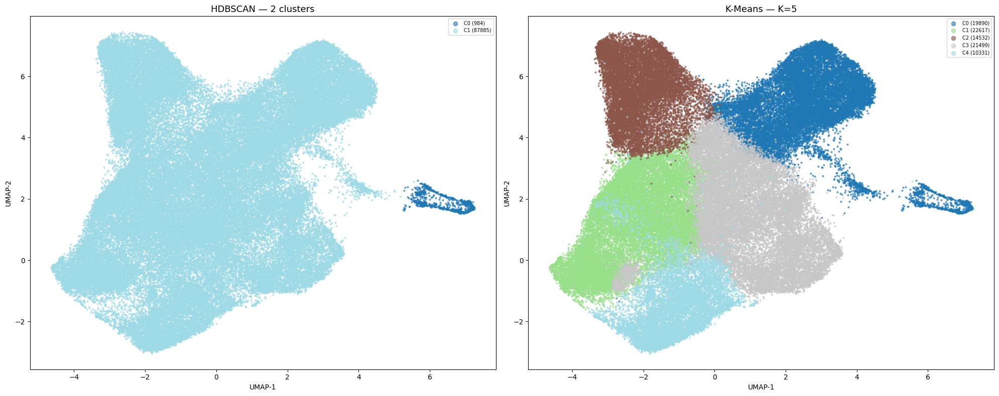

Saved umap_both_methods.png


In [44]:
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

for ax, lab, title in [
    (axes[0], labels,        f"HDBSCAN — {len(set(labels)) - (1 if -1 in labels else 0)} clusters"),
    (axes[1], kmeans_labels, f"K-Means — K={KMEANS_K}"),
]:
    unique = sorted(set(lab))
    cmap   = plt.cm.get_cmap('tab20', len(unique))
    for i, cid in enumerate(unique):
        mask  = lab == cid
        color = 'lightgrey' if cid == -1 else cmap(i)
        alpha = 0.3         if cid == -1 else 0.6
        size  = 2           if cid == -1 else 4
        label = f"Noise ({mask.sum()})" if cid == -1 else f"C{cid} ({mask.sum()})"
        ax.scatter(emb_umap_2d[mask, 0], emb_umap_2d[mask, 1],
                   c=[color], s=size, alpha=alpha, label=label, rasterized=True)
    ax.set_title(title, fontsize=13)
    ax.set_xlabel("UMAP-1")
    ax.set_ylabel("UMAP-2")
    ax.legend(markerscale=3, fontsize=7, loc='upper right',
              ncol=max(1, len(unique) // 12))

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "umap_both_methods.png"), dpi=150)
plt.show()
print("Saved umap_both_methods.png")

/tmp/ipykernel_47441/970440474.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap    = plt.cm.get_cmap('tab20', max(n_clusters, 1))


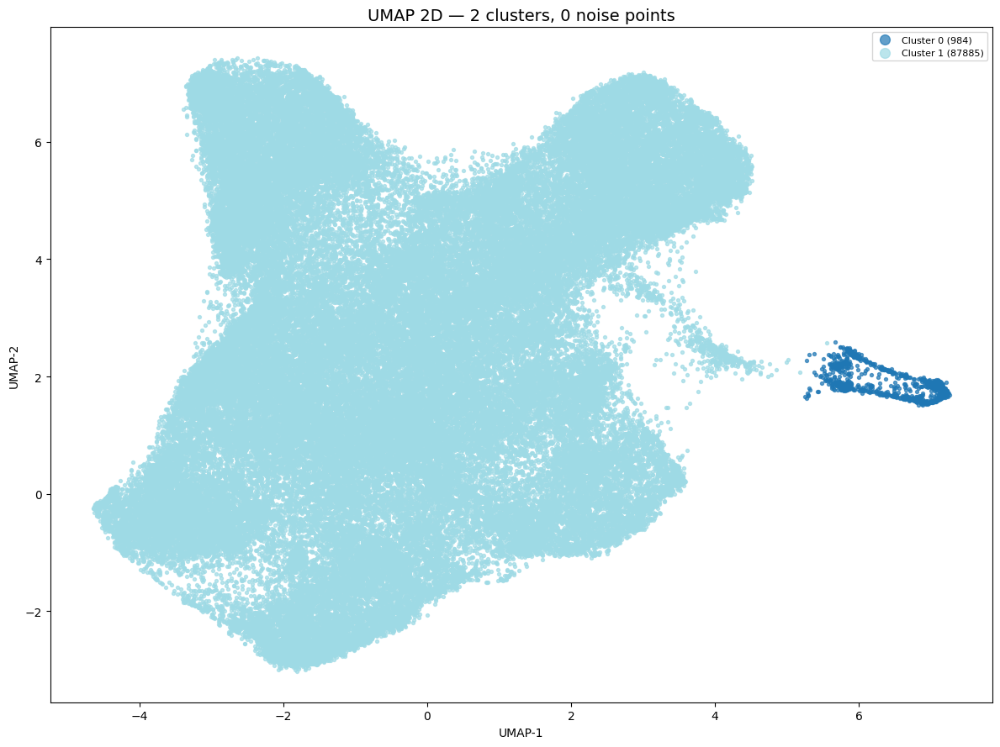

Saved umap_clusters.png


In [45]:
# HDBSCAN-only scatter (combined view is in the cell above)
fig, ax = plt.subplots(figsize=(12, 9))

unique_labels = sorted(set(labels))
# Noise gets grey; clusters get a qualitative colormap
cmap    = plt.cm.get_cmap('tab20', max(n_clusters, 1))
palette = {cid: ('lightgrey' if cid == -1 else cmap(i))
           for i, cid in enumerate(unique_labels)}

for cid in unique_labels:
    mask = labels == cid
    ax.scatter(
        emb_umap_2d[mask, 0], emb_umap_2d[mask, 1],
        c     = [palette[cid]],
        s     = 4 if cid == -1 else 8,
        alpha = 0.4 if cid == -1 else 0.7,
        label = f"Noise ({mask.sum()})" if cid == -1 else f"Cluster {cid} ({mask.sum()})",
        rasterized = True,
    )

ax.set_title(f"UMAP 2D — {n_clusters} clusters, {n_noise} noise points", fontsize=14)
ax.set_xlabel("UMAP-1")
ax.set_ylabel("UMAP-2")
ax.legend(markerscale=3, fontsize=8, loc='upper right',
          ncol=max(1, n_clusters // 15))
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "umap_clusters.png"), dpi=150)
plt.show()
print("Saved umap_clusters.png")

=== HDBSCAN cluster grids ===


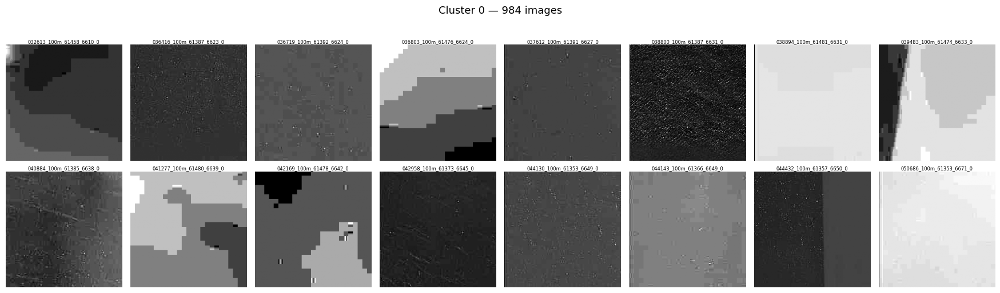

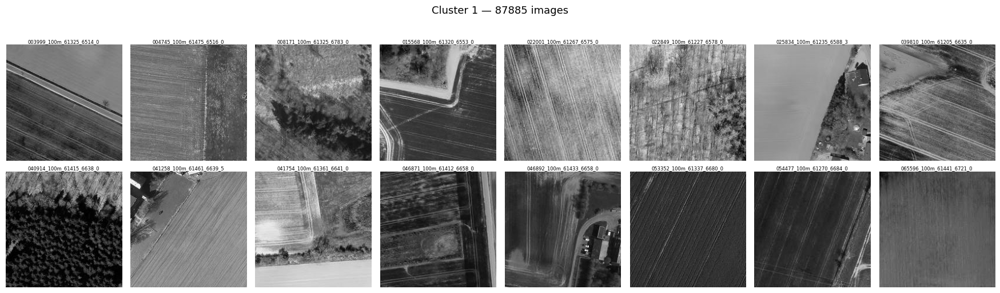


=== K-Means cluster grids ===


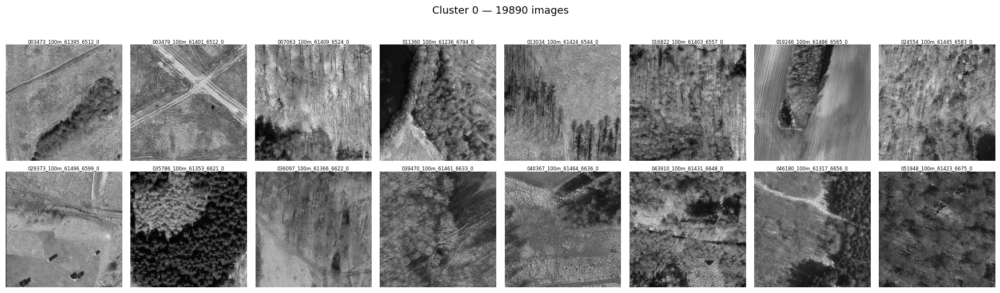

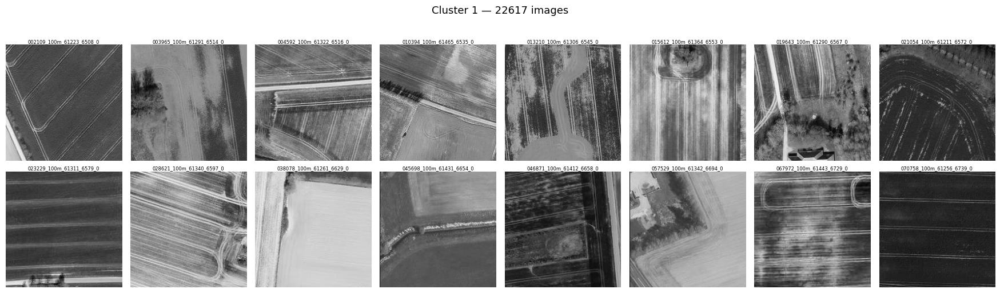

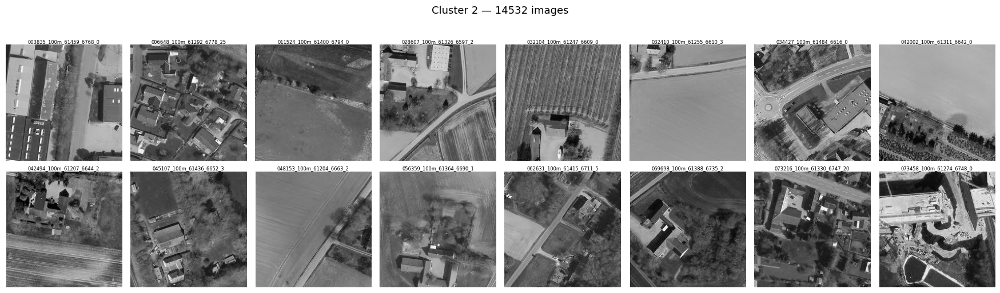

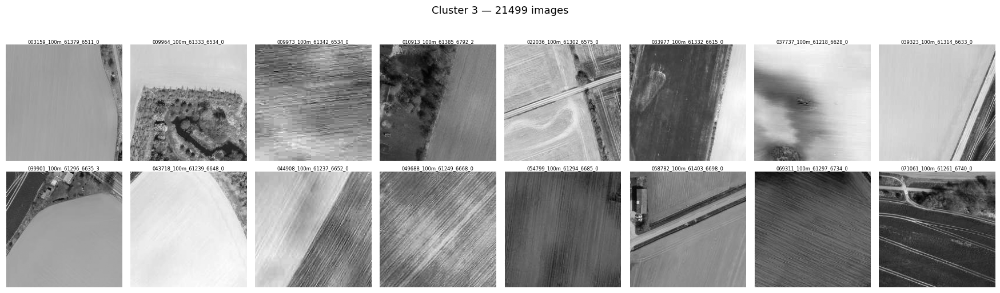

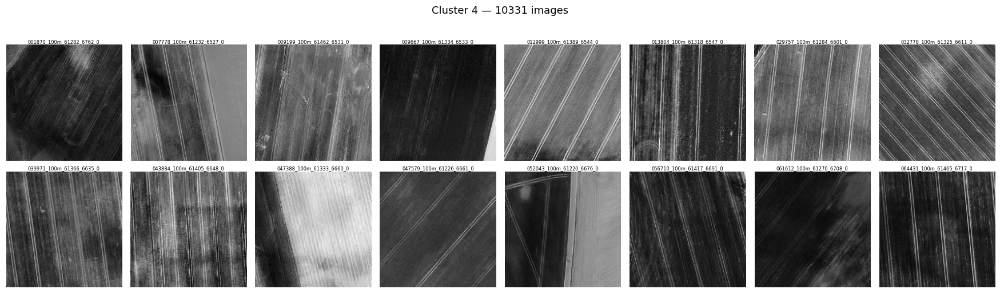

In [46]:
def show_cluster_grid(cluster_id, paths, labels, n_show=16, save_dir=OUTPUT_DIR):
    """Display a grid of sample images from one cluster.
    Each image is shown with its filename stem as a subtitle.
    """
    idxs = np.where(labels == cluster_id)[0]
    # Sample randomly so the grid isn't always just the first N images
    if len(idxs) > n_show:
        idxs = np.random.choice(idxs, n_show, replace=False)
    idxs = sorted(idxs)

    ncols = min(8, len(idxs))
    nrows = int(np.ceil(len(idxs) / ncols))
    fig, axes = plt.subplots(nrows, ncols,
                             figsize=(ncols * 2.2, nrows * 2.6),
                             squeeze=False)
    axes = axes.reshape(-1)

    cluster_size = int((labels == cluster_id).sum())
    title = (f"Noise — {cluster_size} images"
             if cluster_id == -1
             else f"Cluster {cluster_id} — {cluster_size} images")
    fig.suptitle(title, fontsize=13, y=1.01)

    for ax, idx in zip(axes, idxs):
        # Load original image (not the normalised tensor) directly from disk
        img = Image.open(paths[idx]).convert("L")
        img_id = Path(paths[idx]).stem          # filename without extension = image ID
        ax.imshow(img, cmap="gray", aspect="equal")
        ax.set_title(img_id, fontsize=6, pad=2)
        ax.axis("off")

    for ax in axes[len(idxs):]:
        ax.axis("off")

    plt.tight_layout()
    fname = "cluster_noise.png" if cluster_id == -1 else f"cluster_{cluster_id:03d}.png"
    plt.savefig(os.path.join(save_dir, fname), dpi=120, bbox_inches="tight")
    plt.show()
    plt.close()


def show_image_by_id(image_id: str, paths: list):
    """Given a filename stem (image ID), find and display the original image."""
    matches = [p for p in paths if Path(p).stem == image_id]
    if not matches:
        print(f"No image found with ID '{image_id}'")
        return
    path = matches[0]
    cluster_id = int(labels[all_paths.index(path)])
    img = Image.open(path).convert("L")

    fig, ax = plt.subplots(figsize=(4, 4))
    ax.imshow(img, cmap="gray", aspect="equal")
    ax.set_title(f"ID: {image_id}\nCluster: {cluster_id}", fontsize=11)
    ax.axis("off")
    plt.tight_layout()
    plt.show()
    plt.close()
    print(f"  Path:    {path}")
    print(f"  Cluster: {cluster_id}")


# ── HDBSCAN grids ─────────────────────────────────────────────────────────────
os.makedirs(os.path.join(OUTPUT_DIR, "hdbscan"), exist_ok=True)
os.makedirs(os.path.join(OUTPUT_DIR, "kmeans"),  exist_ok=True)

print("=== HDBSCAN cluster grids ===")
for cid in sorted(set(labels)):
    show_cluster_grid(cid, all_paths, labels, save_dir=os.path.join(OUTPUT_DIR, "hdbscan"))



# ── K-Means grids ─────────────────────────────────────────────────────────────
print("\n=== K-Means cluster grids ===")
for cid in sorted(set(kmeans_labels)):
    show_cluster_grid(cid, all_paths, kmeans_labels, save_dir=os.path.join(OUTPUT_DIR, "kmeans"))

# ── Example: look up a specific image by its ID ───────────────────────────────
# Uncomment and replace with any filename stem to inspect a single image:
# show_image_by_id("your_image_filename_without_extension", all_paths)


In [47]:
import csv

# Save HDBSCAN assignments
hdb_csv = os.path.join(OUTPUT_DIR, "clusters_hdbscan.csv")
with open(hdb_csv, "w", newline="") as f:
    writer = csv.writer(f)
    writer.writerow(["image_id", "path", "hdbscan_cluster"])
    for path, label in zip(all_paths, labels):
        writer.writerow([Path(path).stem, path, int(label)])
print(f"Saved → {hdb_csv}")

# Save K-Means assignments
km_csv = os.path.join(OUTPUT_DIR, "clusters_kmeans.csv")
with open(km_csv, "w", newline="") as f:
    writer = csv.writer(f)
    writer.writerow(["image_id", "path", "kmeans_cluster"])
    for path, label in zip(all_paths, kmeans_labels):
        writer.writerow([Path(path).stem, path, int(label)])
print(f"Saved → {km_csv}")

n_hdb = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = int((labels == -1).sum())
print(f"\nHDBSCAN: {n_hdb} clusters, {n_noise} noise points ({100*n_noise/len(labels):.1f}%)")
print(f"K-Means: {KMEANS_K} clusters, 0 noise points (every image assigned)")


Saved → output/clusters_hdbscan.csv
Saved → output/clusters_kmeans.csv

HDBSCAN: 2 clusters, 0 noise points (0.0%)
K-Means: 5 clusters, 0 noise points (every image assigned)


In [16]:
# import shutil
# dest = '/content/drive/MyDrive/AppML/clustering_output'
# shutil.copytree('/content/output', dest, dirs_exist_ok=True)
# print(f"Saved to {dest}")

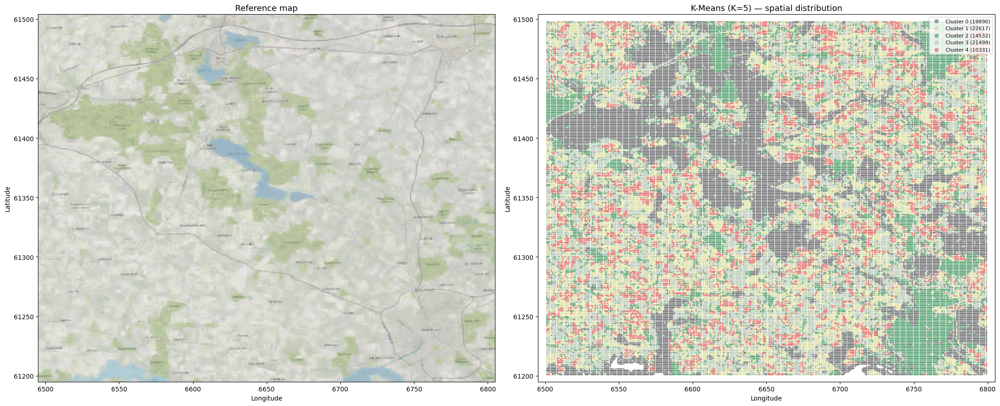

Saved map_kmeans_with_reference.png


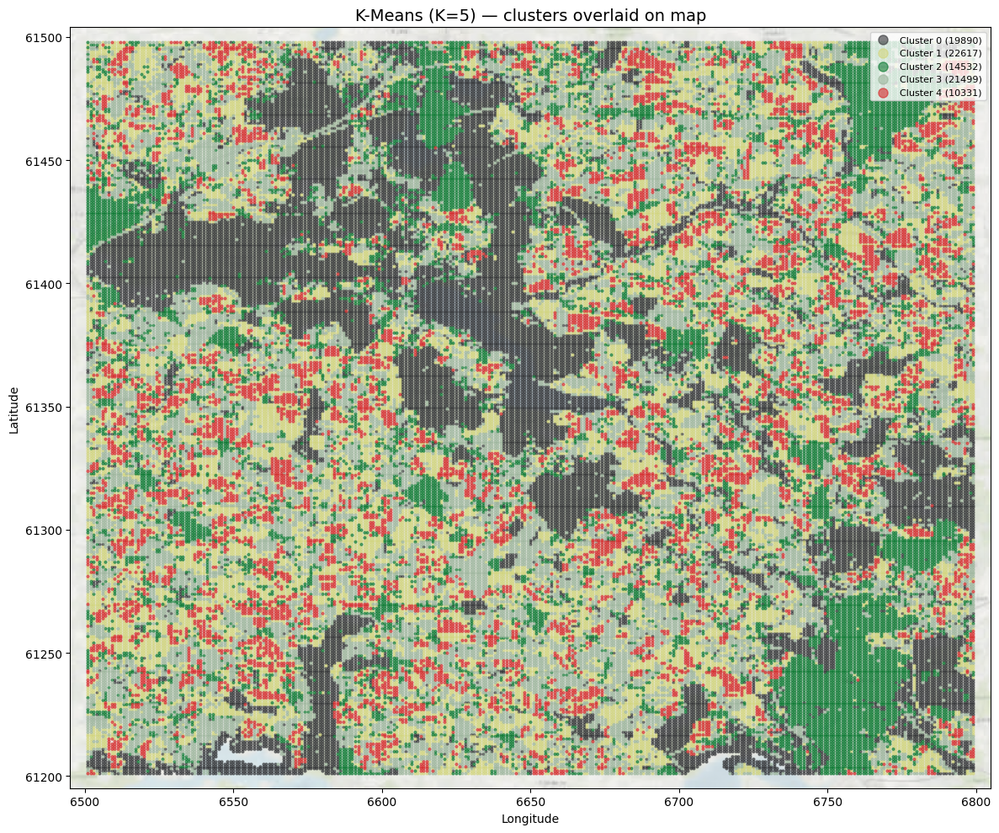

In [48]:


# ── Color per K-Means cluster — edit these to your preference ─────────────────
KMEANS_COLORS = {
    0:  "#303134",
    1:  "#d2d57b9d",
    2:  "#06772ee0",
    3:  "#9cb59c",
    4:  "#d62728",
}

# ── Load your background image from Drive ─────────────────────────────────────
MAP_IMAGE_PATH = '/content/drive/MyDrive/AppML/Screenshot 2026-06-03 142450.png'
#MAP_IMAGE_PATH = '/content/drive/MyDrive/AppML/aEleNRlJ.jpg'
map_img = plt.imread(MAP_IMAGE_PATH)

long_min, long_max = coords[:, 0].min(), coords[:, 0].max()
lat_min,  lat_max  = coords[:, 1].min(), coords[:, 1].max()

margin_long = (long_max - long_min) * 0.02
margin_lat  = (lat_max  - lat_min)  * 0.02
extent = [long_min - margin_long, long_max + margin_long,
          lat_min  - margin_lat,  lat_max  + margin_lat]

fig, axes = plt.subplots(1, 2, figsize=(22, 9))

# ── Left panel: background map image ──────────────────────────────────────────
axes[0].imshow(map_img,
               extent=extent,
               aspect='auto',
               origin='upper')
axes[0].set_xlim(extent[0], extent[1])
axes[0].set_ylim(extent[2], extent[3])
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
axes[0].set_title("Reference map", fontsize=13)

# ── Right panel: K-Means scatter, same frame ──────────────────────────────────
for cid in sorted(set(kmeans_labels)):
    mask  = kmeans_labels == cid
    color = KMEANS_COLORS.get(cid, 'black')  # uses exactly the color you defined above
    axes[1].scatter(coords[mask, 0], coords[mask, 1],
                    color=color,              # 'color=' never re-interprets strings as colormaps
                    s=2, alpha=0.4,
                    label=f"Cluster {cid} ({mask.sum()})",
                    rasterized=True)

axes[1].set_xlim(extent[0], extent[1])
axes[1].set_ylim(extent[2], extent[3])
axes[1].set_xlabel("Longitude")
axes[1].set_ylabel("Latitude")
axes[1].set_title(f"K-Means (K={KMEANS_K}) — spatial distribution", fontsize=13)
axes[1].legend(markerscale=4, fontsize=8, loc='upper right')

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "map_kmeans_with_reference.png"), dpi=150)
plt.show()
print("Saved map_kmeans_with_reference.png")

#Now trying to combine the two images into one, with the map as a faint background and the clusters overlaid on top.
plt.figure(figsize=(12, 10))
plt.imshow(map_img, extent=extent, aspect='auto', origin='upper', alpha=0.5)
for cid in sorted(set(kmeans_labels)):
    mask  = kmeans_labels == cid
    color = KMEANS_COLORS.get(cid, 'black')
    plt.scatter(coords[mask, 0], coords[mask, 1],
                color=color,
                s=4, alpha=0.6,
                label=f"Cluster {cid} ({mask.sum()})",
                rasterized=True)
plt.xlim(extent[0], extent[1])
plt.ylim(extent[2], extent[3])
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title(f"K-Means (K={KMEANS_K}) — clusters overlaid on map", fontsize=14)
plt.legend(markerscale=4, fontsize=8, loc='upper right')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "map_kmeans_overlay.png"), dpi=150)
plt.show()


In [ ]:
#Checking what is in my output dir:

#Removing all files that are just cluster_*.png (the individual cluster grids) to save space, but keeping the combined map images and CSVs and all directories.
!rm {OUTPUT_DIR}/cluster_*.png
!ls {OUTPUT_DIR}

#Saving the output directory to my Drive so I can download it on my local machine:
!cp -r {OUTPUT_DIR} /content/drive/MyDrive/AppML/clustering_output_2

#Emptying output dir
!rm -rf {OUTPUT_DIR}/*



rm: cannot remove 'output/cluster_*.png': No such file or directory
best_model.pth		 hdbscan		 map_kmeans.png
cluster_assignments.csv  kmeans			 map_kmeans_with_reference.png
clusters_hdbscan.csv	 map_clusters.png	 umap_both_methods.png
clusters_kmeans.csv	 map_kmeans_overlay.png  umap_clusters.png


rm: cannot remove 'output/hdbscan': Is a directory
rm: cannot remove 'output/kmeans': Is a directory
